Based on the [Chapter 19 Notebook](https://github.com/ageron/handson-mlp/blob/main/19_reinforcement_learning.ipynb) of Hands-on Machine Learning.

_This notebook contains all the sample code and solutions to the exercises in chapter 19._

In [ ]:
import sys
IS_COLAB = "google.colab" in sys.modules
IS_KAGGLE = "kaggle_secrets" in sys.modules

If using Colab, the Box2D and Stable-Baselines3 library are not pre-installed so we must install them manually. In Kaggle, Box2D is not preinstalled either, but Stable-Baselines3 and gymnasium are preinstalled, but too old, so we must update them.

In [ ]:
if IS_COLAB:
    %pip uninstall -qy gym
    %pip install -qU Box2D stable_baselines3

if IS_KAGGLE:
    %pip uninstall -qy gym
    %pip install -qU gymnasium
    %pip install -qU Box2D stable_baselines3

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 3.7/3.7 MB 28.2 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 188.0/188.0 kB 7.6 MB/s eta 0:00:00


In [ ]:
import torch
import matplotlib.pyplot as plt

This chapter can be very slow without a hardware accelerator, so if we can find one, let's use it:

In [ ]:
if torch.cuda.is_available():
    device = "cuda"
elif torch.backends.mps.is_available():
    device = "mps"
else:
    device = "cpu"

device

'cuda'

Let's issue a warning if there's no hardware accelerator available:

In [ ]:
if device == "cpu":
    print("Neural nets can be very slow without a hardware accelerator.")
    if IS_COLAB:
        print("Go to Runtime > Change runtime and select a GPU hardware "
              "accelerator.")
    if IS_KAGGLE:
        print("Go to Settings > Accelerator and select GPU.")

# Introduction to Gymnasium

In [ ]:
import gymnasium as gym

env = gym.make("CartPole-v1", render_mode="rgb_array", max_episode_steps=1000)

In [ ]:
# Learn more about the environment at https://gymnasium.farama.org/environments/classic_control/cart_pole/
obs, info = env.reset(seed=42)
obs # position, velocity, angle, angular velocity

array([ 0.0273956 , -0.00611216,  0.03585979,  0.0197368 ], dtype=float32)

In [ ]:
img = env.render()
img.shape  # height, width, channels (3 = Red, Green, Blue)

(400, 600, 3)

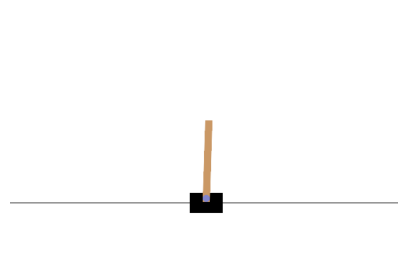

In [ ]:
# extra code – creates a little function to render and plot an environment

def plot_environment(env, figsize=(5, 4)):
    plt.figure(figsize=figsize)
    img = env.render()
    plt.imshow(img)
    plt.axis("off")
    return img

plot_environment(env)
plt.show()

In [ ]:
# 0 to move left, 1 to move right
env.action_space

Discrete(2)

In [ ]:
action = 1  # accelerate right
obs, reward, done, truncated, info = env.step(action)
obs

array([ 0.02727336,  0.18847767,  0.03625453, -0.26141977], dtype=float32)

In [ ]:
reward, done, truncated, info

(1.0, False, False, {})

In [ ]:
# Done: off the edge/tipped too far (failure condition, truncated = reached max iterations
if done or truncated:
    obs, info = env.reset()

# A simple hard-coded policy

In [ ]:
def basic_policy(obs):
    angle = obs[2]
    return 0 if angle < 0 else 1  # go left if leaning left, otherwise go right

totals = []
for episode in range(500):
    total_rewards = 0
    obs, info = env.reset(seed=episode)
    while True:  # no risk of infinite loop: will be truncated after 1000 steps
        action = basic_policy(obs)
        obs, reward, done, truncated, info = env.step(action)
        total_rewards += reward
        if done or truncated:
            break

    totals.append(total_rewards)

In [ ]:
import numpy as np

# How many episodes did we last, on average?
np.mean(totals), np.std(totals), min(totals), max(totals)

(np.float64(41.698), np.float64(8.389445512070509), 24.0, 63.0)

Let's visualize one episode. You can learn more about Matplotlib animations in the [Matplotlib tutorial notebook](tools_matplotlib.ipynb#Animations).

In [ ]:
# extra code – this cell displays an animation of one episode
import matplotlib.animation
from IPython.display import HTML

def update_scene(num, frames, patch):
    patch.set_data(frames[num])
    return patch,

def plot_animation(frames, repeat=False, interval=40):
    fig = plt.figure()
    patch = plt.imshow(frames[0])
    plt.axis('off')
    anim = matplotlib.animation.FuncAnimation(
        fig, update_scene, fargs=(frames, patch),
        frames=len(frames), repeat=repeat, interval=interval)
    plt.close()
    return anim

def show_one_episode(policy, seed=42):
    frames = []
    env = gym.make("CartPole-v1", render_mode="rgb_array",
                   max_episode_steps=1000)
    obs, info = env.reset(seed=seed)
    while True:
        frames.append(env.render())
        action = policy(obs)
        obs, reward, done, truncated, info = env.step(action)
        if done or truncated:
            print(obs[0]) # abs(pos) > 2.4?
            print(obs[2] * 180 / np.pi) # abs(angle) > 12 degrees?
            break
    env.close()
    # Colab needs explicit display of HTML element
    return HTML(plot_animation(frames).to_jshtml())

show_one_episode(basic_policy)

-0.17964524
12.949518


# Neural Network Policies

In [ ]:
import torch
import torch.nn as nn

class PolicyNetwork(nn.Module):
    def __init__(self):
        super().__init__()
        self.net = nn.Sequential(
            nn.Linear(4, 5), # super simple, just 5 nodes -- how many parameters?
            nn.ReLU(),
            nn.Linear(5, 1))

    def forward(self, state):
        return self.net(state)

In [ ]:
def choose_action(model, obs):
    state = torch.as_tensor(obs) # convert observations to tensors directly
    logit = model(state) # forward pass
    # print(logit)
    dist = torch.distributions.Bernoulli(logits=logit) # 0 or 1?
    action = dist.sample() # sample based on liklihood
    log_prob = dist.log_prob(action)
    return int(action.item()), log_prob

In [ ]:
# extra code – a function that creates an animation for a given policy model

torch.manual_seed(42)
model = PolicyNetwork()
model.eval()

def neural_net_policy(obs):
    with torch.no_grad():
        action, _ = choose_action(model, obs)
        return action

show_one_episode(neural_net_policy)

0.17774981
-12.334941


## Policy Gradients

Nothing is actually trained yet, we've just configured the cartpole to respond to decisions from the NN. Now we'll set up the action/reward system.

In [ ]:
def compute_returns(rewards, discount_factor):
    returns = rewards.copy() # don't overwrite the rewards vector
    for step in range(len(returns) - 1, 0, -1):
        returns[step - 1] += returns[step] * discount_factor # apply the discount

    return torch.tensor(returns)

In [ ]:
# example of how the discount factor is applied repeatedly
compute_returns([10, 0, -50], discount_factor=0.8)

tensor([-22., -40., -50.])

In [ ]:
def run_episode(model, env, seed=None):
    log_probs, rewards = [], []
    obs, info = env.reset(seed=seed)
    while True:  # the environment will truncate the episode if it is too long
        action, log_prob = choose_action(model, obs)
        obs, reward, done, truncated, _info = env.step(action)
        log_probs.append(log_prob)
        rewards.append(reward)
        if done or truncated:
            return log_probs, rewards

In [ ]:
def train_reinforce(model, optimizer, env, n_episodes, discount_factor):
    for episode in range(n_episodes):
        seed = torch.randint(0, 2**32, size=()).item() # I'm not sure why this specific seed is used
        log_probs, rewards = run_episode(model, env, seed=seed) # forward pass
        returns = compute_returns(rewards, discount_factor) # apply discount factor
        std_returns = (returns - returns.mean()) / (returns.std() + 1e-7) # normalize
        losses = [-logp * rt for logp, rt in zip(log_probs, std_returns)] # the REINFORCE loss function
        loss = torch.cat(losses).sum()
        optimizer.zero_grad() # as usual, we need to update gradients
        loss.backward() # The usual backpropagation to find gradient of weights
        optimizer.step() # Again, the usual step
        print(f"\rEpisode {episode + 1}, Reward: {sum(rewards):.2f}", end=" ")

In [ ]:
torch.manual_seed(42)
model = PolicyNetwork()
optimizer = torch.optim.NAdam(model.parameters(), lr=0.06)
train_reinforce(model, optimizer, env, n_episodes=200, discount_factor=0.95)

Episode 200, Reward: 1000.00 

In [ ]:
show_one_episode(neural_net_policy)

1.1775869
-2.3056176


# Deep Q-Network

Let's build the DQN. Given a state, it will estimate, for each possible action, the sum of discounted future rewards it can expect after it plays that action (but before it sees its outcome):

In [ ]:
class DQN(nn.Module):
    def __init__(self):
        super().__init__()
        self.net = nn.Sequential(nn.Linear(4, 32), nn.ReLU(),
                                 nn.Linear(32, 32), nn.ReLU(),
                                 nn.Linear(32, 2))

    def forward(self, state):
        return self.net(state)

In [ ]:
def choose_dqn_action(model, obs, epsilon=0.0):
        if torch.rand(()) < epsilon:  # epsilon greedy policy
            return torch.randint(2, size=()).item()
        else:
            state = torch.as_tensor(obs)
            Q_values = model(state)
            return Q_values.argmax().item()  # optimal according to the DQN

We will also need a replay buffer. It will contain the agent's experiences. Each experience will be represented as a tuple with six elements: (state, action, reward, next_state, done, truncated).

Let's also create a function to sample experiences from the replay buffer. It will return a tuple containing a tensor for each of the six fields:

In [ ]:
def sample_experiences(replay_buffer, batch_size):
    indices = torch.randint(len(replay_buffer), size=[batch_size])
    batch = [replay_buffer[index] for index in indices.tolist()]
    return [to_tensor([exp[index] for exp in batch]) for index in range(6)]

def to_tensor(data):
    array = np.stack(data)
    dtype = torch.float32 if array.dtype == np.float64 else None
    return torch.as_tensor(array, dtype=dtype)

**Note**: for very large replay buffers (e.g., 100,000 or more), you may want to use a circular buffer instead, as random access time will be O(1) instead of O(N). Or you can check out DeepMind's [Reverb library](https://github.com/deepmind/reverb).

In [ ]:
# extra code – A basic circular buffer implementation

class ReplayBuffer:
    def __init__(self, max_length):
        self.data = [None] * max_length
        self.max_length = max_length
        self.index = 0
        self.length = 0

    def append(self, obj):
        self.data[self.index] = obj
        self.length = min(self.length + 1, self.max_length)
        self.index = (self.index + 1) % self.max_length

    def __getitem__(self, index):
        if index < 0 or index >= self.length:
            raise IndexError(f"replay buffer index out of range: {index}")
        return self.data[index]

    def __len__(self):
        return self.length

buff = ReplayBuffer(max_length=4)
for i in range(8):
    buff.append(i)
    print(f"Length: {len(buff)}, data: {buff.data}")

Length: 1, data: [0, None, None, None]
Length: 2, data: [0, 1, None, None]
Length: 3, data: [0, 1, 2, None]
Length: 4, data: [0, 1, 2, 3]
Length: 4, data: [4, 1, 2, 3]
Length: 4, data: [4, 5, 2, 3]
Length: 4, data: [4, 5, 6, 3]
Length: 4, data: [4, 5, 6, 7]


Now we can create a function that will use the DQN to play one step, and record its experience in the replay buffer:

In [ ]:
def play_and_record_episode(model, env, replay_buffer, epsilon, seed=None):
    obs, _info = env.reset(seed=seed)
    total_rewards = 0
    model.eval()
    with torch.no_grad():
        while True:
            action = choose_dqn_action(model, obs, epsilon) # epsilon greedy strategy
            next_obs, reward, done, truncated, _info = env.step(action) # exploration
            experience = (obs, action, reward, next_obs, done, truncated) # record experience
            replay_buffer.append(experience)
            total_rewards += reward
            if done or truncated:
                return total_rewards
            obs = next_obs

Lastly, let's create a function that will sample some experiences from the replay buffer and perform a training step:

In [ ]:
def dqn_training_step(model, optimizer, criterion, replay_buffer, batch_size,
                      discount_factor):
    experiences = sample_experiences(replay_buffer, batch_size) # sample a random experiences
    state, action, reward, next_state, done, truncated = experiences
    with torch.inference_mode():
        next_Q_value = model(next_state) # predict the next Q value

    max_next_Q_value, _ = next_Q_value.max(dim=1)
    running = (~(done | truncated)).float()  # 0 if s' is over, 1 if running
    target_Q_value = reward + running * discount_factor * max_next_Q_value
    all_Q_values = model(state)
    Q_value = all_Q_values.gather(dim=1, index=action.unsqueeze(1))
    loss = criterion(Q_value, target_Q_value.unsqueeze(1)) # compare discounted Q value to predicted
    optimizer.zero_grad()
    loss.backward()
    optimizer.step()

And now, let's train the model!

In [ ]:
from collections import deque

def train_dqn(model, env, replay_buffer, optimizer, criterion, n_episodes=800,
              warmup=30, batch_size=32, discount_factor=0.95):
    totals = []
    for episode in range(n_episodes):
        epsilon = max(1 - episode / 500, 0.01)
        seed = torch.randint(0, 2**32, size=()).item()
        total_rewards = play_and_record_episode(model, env, replay_buffer,
                                                epsilon, seed=seed)
        print(f"\rEpisode: {episode + 1}, Rewards: {total_rewards}", end=" ")
        totals.append(total_rewards)
        if episode >= warmup:
            dqn_training_step(model, optimizer, criterion, replay_buffer,
                              batch_size, discount_factor)
    return totals

torch.manual_seed(42)
dqn = DQN()
optimizer = torch.optim.NAdam(dqn.parameters(), lr=0.03)
mse = nn.MSELoss()
replay_buffer = deque(maxlen=100_000)



totals = train_dqn(dqn, env, replay_buffer, optimizer, mse)

Episode: 800, Rewards: 1000.0 

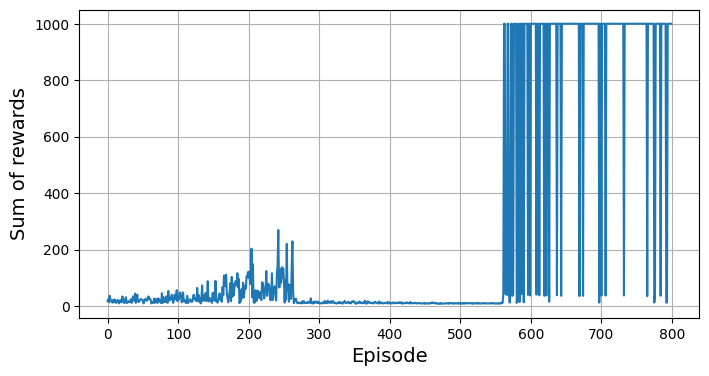

In [ ]:
# extra code – this cell generates Figure 19–10
plt.figure(figsize=(8, 4))
plt.plot(totals)
plt.xlabel("Episode", fontsize=14)
plt.ylabel("Sum of rewards", fontsize=14)
plt.grid(True)

plt.show()

In [ ]:
# extra code – shows an animation of the trained DQN playing one episode

torch.manual_seed(42)
dqn.eval()

def dqn_policy(obs):
    with torch.no_grad():
        return choose_dqn_action(dqn, obs)

show_one_episode(dqn_policy)

0.06978418
0.45286745


That's a very stable CartPole! 😀